In [2]:
pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.8 MB/s eta 0:00:00



image 1/1 /content/image.jpeg: 256x640 1 potted plant, 1 laptop, 1 keyboard, 1 cell phone, 1 vase, 108.4ms
Speed: 8.1ms preprocess, 108.4ms inference, 1.8ms postprocess per image at shape (1, 3, 256, 640)


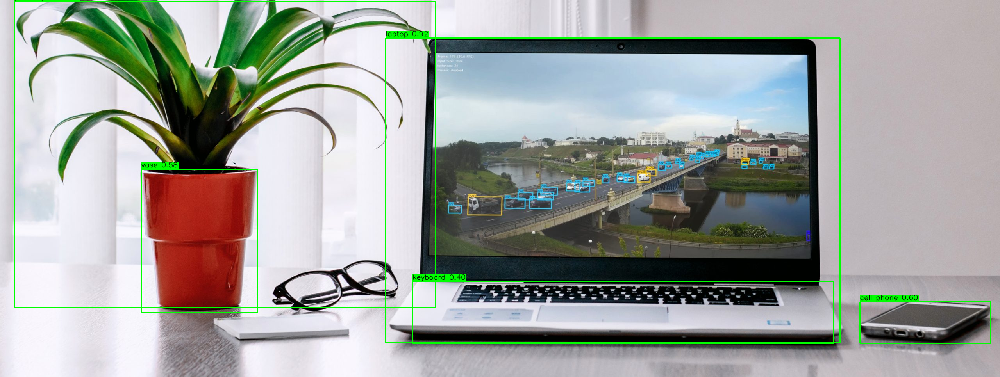

Saved as output_with_labels.jpg


In [4]:
# Install YOLOv8
# pip install ultralytics

from ultralytics import YOLO
import cv2
from google.colab.patches import cv2_imshow

# Load pretrained YOLOv8 model
model = YOLO("yolov8n.pt")

# Run detection on an image
results = model("image.jpeg")

# Loop through detections
for r in results:
    boxes = r.boxes  # bounding box outputs

    # Read original image
    img = cv2.imread("image.jpeg")

    for box in boxes:
        # Extract box coordinates
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)

        # Extract confidence
        conf = float(box.conf[0])

        # Extract class id and name
        cls_id = int(box.cls[0])
        label = model.names[cls_id]

        # Create display text
        text = f"{label} {conf:.2f}"

        # Draw bounding box
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Draw label background
        (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)
        cv2.rectangle(img, (x1, y1 - th - 4), (x1 + tw, y1), (0, 255, 0), -1)

        # Put label text
        cv2.putText(img, text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (0, 0, 0), 1, cv2.LINE_AA)

# Show in Colab
cv2_imshow(img)

# Save output
cv2.imwrite("output_with_labels.jpg", img)
print("Saved as output_with_labels.jpg")


In [6]:
pip install ultralytics opencv-python

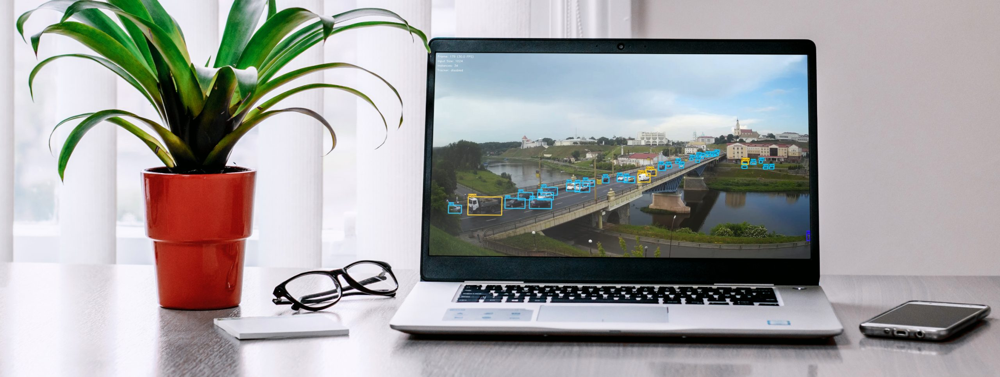


image 1/1 /content/image.jpeg: 256x640 1 potted plant, 1 laptop, 1 keyboard, 1 cell phone, 1 vase, 151.2ms
Speed: 2.6ms preprocess, 151.2ms inference, 2.5ms postprocess per image at shape (1, 3, 256, 640)
Results saved to /content/runs/detect/predict2


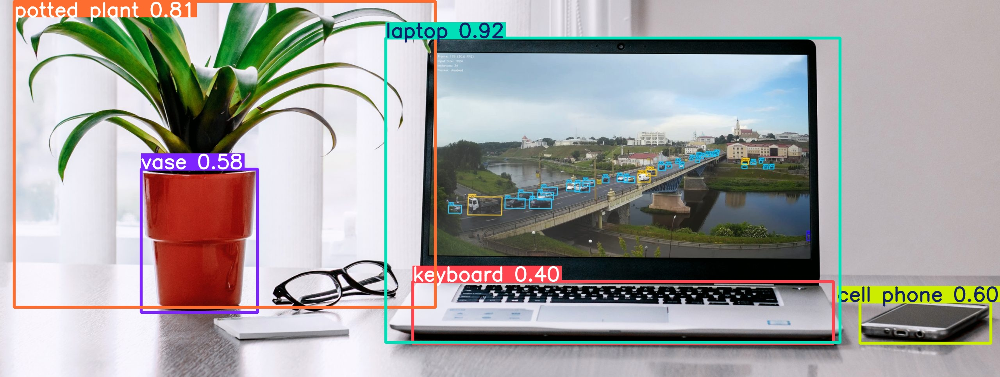

In [8]:
from ultralytics import YOLO
import cv2
import os
from google.colab.patches import cv2_imshow
from pathlib import Path

# Load the model
model = YOLO("yolov8n.pt")  # You can use yolov8s.pt or yolov8m.pt for more accuracy

# Load and show the original image
img_path = "/content/image.jpeg"  # Replace with your .png image path
original = cv2.imread(img_path)
cv2_imshow(original)
# cv2.waitKey(0) # waitKey is not needed with cv2_imshow

# Run detection and save result
results = model(img_path, save=True)

# Find the latest output directory
output_dir = max(Path("runs/detect").glob("predict*"), key=os.path.getmtime)

# Load and show the image with boxes and labels
# Search for any image file in the output directory
image_files = list(output_dir.glob("*.png")) + list(output_dir.glob("*.jpg"))
output_img = image_files[0] # Assuming there is at least one image file

output = cv2.imread(str(output_img))
cv2_imshow(output)
# cv2.waitKey(0) # waitKey is not needed with cv2_imshow
# cv2.destroyAllWindows() # destroyAllWindows is not needed with cv2_imshow